In [1]:
# {
#     "date": ["2025-01-01", "2025-01-02", "2025-01-03"],
#     "description": ["Payment to ABC", "Rent January", "Office Supplies"],
#     "debit": [100, 500, 200],
#     "credit": [0, 0, 0],
#     "balance": [900, 400, 200]
# }

In [2]:
%pip install fuzzywuzzy
%pip install python-Levenshtein
%pip install tabulate
%pip install onnx
%pip install netron
%pip install scikit-learn
%pip install pandas
%pip install tensorflow
%pip install catboost

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [3]:
import pandas as pd
cashBookDf = pd.read_excel("cashbook and bank_st.xlsx", sheet_name="CashBook")
bankStatementDf = pd.read_excel("cashbook and bank_st.xlsx", sheet_name="Bank Statement")

In [4]:
cashBookDf.head()

,Transaction Date,Description,Currency,Credit,Debit,Balance
0,2020.01.01,Software Consulting Service Payment,LKR,500000.0,NaN,5500000.0
1,2020.01.01,Office Rent Payment - January,LKR,NaN,150000.0,5350000.0
2,2020.01.02,Client Payment - Custom Software Development,LKR,300000.0,NaN,5650000.0
3,2020.01.02,Software Subscription - Yearly Renewal,LKR,NaN,200000.0,5450000.0
4,2020.01.03,Cloud Application Development,LKR,450000.0,NaN,5900000.0


In [5]:
bankStatementDf.head(100)

,Transaction Date,Description,Currency,Credit,Debit,Balance
0,2020.01.01,Software Consulting Service Payment,LKR,500000.0,NaN,5500000.0
1,2020.01.01,Office Rent Payment - January,LKR,NaN,150000.0,5350000.0
2,2020.01.02,Client Payment - Custom Software Development,LKR,300000.0,NaN,5650000.0
3,2020.01.02,Software Subscription - Yearly Renewal,LKR,NaN,200000.0,5450000.0
4,2020.01.03,Cloud Application Development,LKR,450000.0,NaN,5900000.0
...,...,...,...,...,...,...
95,2020.02.12,Software Licensing Payment,LKR,400000.0,NaN,21380000.0
96,2020.02.12,Office Snacks - Monthly Refill,LKR,NaN,15000.0,21365000.0
97,2020.02.12,Business Consulting Fee - Retainer,LKR,300000.0,NaN,21665000.0
98,2020.02.13,Custom Software Development Service Payment,LKR,650000.0,NaN,22315000.0


In [6]:
# Convert dates to datetime format, coercing errors to NaT
cashBookDf["Transaction Date"] = pd.to_datetime(cashBookDf["Transaction Date"], errors='coerce')
bankStatementDf["Transaction Date"] = pd.to_datetime(bankStatementDf["Transaction Date"], errors='coerce')

# Optionally inspect rows with invalid dates (now converted to NaT)
invalid_cash_dates = cashBookDf[cashBookDf["Transaction Date"].isna()]
invalid_bank_dates = bankStatementDf[bankStatementDf["Transaction Date"].isna()]

if not invalid_cash_dates.empty:
    print("Invalid dates found in cashBookDf:")
    print(invalid_cash_dates)

if not invalid_bank_dates.empty:
    print("Invalid dates found in bankStatementDf:")
    print(invalid_bank_dates)

# Lowercase descriptions for consistency
cashBookDf["Description"] = cashBookDf["Description"].str.lower()
bankStatementDf["Description"] = bankStatementDf["Description"].str.lower()

# Fill missing values with 0
cashBookDf.fillna(0, inplace=True)
bankStatementDf.fillna(0, inplace=True)


Invalid dates found in cashBookDf:
     Transaction Date                      Description Currency    Credit  \
2130              NaT                   Software Sales      LKR  110000.0   
2131              NaT                  Travel Expenses      LKR    6000.0   
2132              NaT                   Software Sales      LKR       NaN   
2193              NaT  Software Revenue - Client Theta      LKR  125000.0   

         Debit     Balance  
2130       NaN  9623860.07  
2131       NaN  9629860.07  
2132  125000.0  9504860.07  
2193       NaN  9146860.07  
Invalid dates found in bankStatementDf:
     Transaction Date                      Description Currency    Credit  \
2075              NaT                              NaN      NaN       NaN   
2131              NaT                   Software Sales      LKR  110000.0   
2132              NaT                  Travel Expenses      LKR    6000.0   
2133              NaT                   Software Sales      LKR       NaN   
2134     

/var/folders/33/xz6_sxc123zgzcv7_dvly1dh0000gn/T/ipykernel_33352/2884653801.py:22: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0' has dtype incompatible with datetime64[ns], please explicitly cast to a compatible dtype first.
  cashBookDf.fillna(0, inplace=True)
/var/folders/33/xz6_sxc123zgzcv7_dvly1dh0000gn/T/ipykernel_33352/2884653801.py:23: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0' has dtype incompatible with datetime64[ns], please explicitly cast to a compatible dtype first.
  bankStatementDf.fillna(0, inplace=True)


In [7]:
cashBookDf.head()

,Transaction Date,Description,Currency,Credit,Debit,Balance
0,2020-01-01 00:00:00,software consulting service payment,LKR,500000.0,0.0,5500000.0
1,2020-01-01 00:00:00,office rent payment - january,LKR,0.0,150000.0,5350000.0
2,2020-01-02 00:00:00,client payment - custom software development,LKR,300000.0,0.0,5650000.0
3,2020-01-02 00:00:00,software subscription - yearly renewal,LKR,0.0,200000.0,5450000.0
4,2020-01-03 00:00:00,cloud application development,LKR,450000.0,0.0,5900000.0


In [8]:
bankStatementDf.head()

,Transaction Date,Description,Currency,Credit,Debit,Balance
0,2020-01-01 00:00:00,software consulting service payment,LKR,500000.0,0.0,5500000.0
1,2020-01-01 00:00:00,office rent payment - january,LKR,0.0,150000.0,5350000.0
2,2020-01-02 00:00:00,client payment - custom software development,LKR,300000.0,0.0,5650000.0
3,2020-01-02 00:00:00,software subscription - yearly renewal,LKR,0.0,200000.0,5450000.0
4,2020-01-03 00:00:00,cloud application development,LKR,450000.0,0.0,5900000.0


In [9]:
from fuzzywuzzy import fuzz

def calculate_similarity(desc1, desc2):
    return fuzz.ratio(desc1, desc2)

In [10]:
from fuzzywuzzy import fuzz
from itertools import product


def calculate_similarity(desc1, desc2):
    # Convert both descriptions to strings to avoid type errors
    return fuzz.ratio(str(desc1), str(desc2))

# Generate all possible pairs of transactions
pairs = pd.DataFrame(list(product(cashBookDf.iterrows(), bankStatementDf.iterrows())))

# Extract individual transactions
def extract_transactions(row):
    cb, bs = row[0][1], row[1][1]
    return {
        "cb_date": cb["Transaction Date"],
        "bs_date": bs["Transaction Date"],
        "cb_desc": cb["Description"],
        "bs_desc": bs["Description"],
        "cb_credit": cb["Credit"],
        "bs_credit": bs["Credit"],
        "cb_debit": cb["Debit"],
        "bs_debit": bs["Debit"],
        "cb_balance": cb["Balance"],
        "bs_balance": bs["Balance"]
    }

# Apply feature extraction
pairs = pairs.apply(extract_transactions, axis=1, result_type="expand")

# Convert date columns to datetime objects (if not already)
pairs["cb_date"] = pd.to_datetime(pairs["cb_date"])
pairs["bs_date"] = pd.to_datetime(pairs["bs_date"])

# Calculate Features
pairs["date_diff"] = abs((pairs["cb_date"] - pairs["bs_date"]).dt.days)
pairs["desc_similarity"] = pairs.apply(lambda row: calculate_similarity(row["cb_desc"], row["bs_desc"]), axis=1)
pairs["debit_diff"] = abs(pairs["cb_debit"] - pairs["bs_debit"])
pairs["credit_diff"] = abs(pairs["cb_credit"] - pairs["bs_credit"])
pairs["balance_diff"] = abs(pairs["cb_balance"] - pairs["bs_balance"])


In [11]:
pairs.shape

(13890385, 15)

In [12]:
pairs.tail()

,cb_date,bs_date,cb_desc,bs_desc,cb_credit,bs_credit,cb_debit,bs_debit,cb_balance,bs_balance,date_diff,desc_similarity,debit_diff,credit_diff,balance_diff
13890380,2025-02-28,2025-02-28,salary payment - employee,utility payment - internet,321646.09,0.00,0.0,133920.49,1.903582e+08,1.658996e+08,0,59,133920.49,321646.09,24458616.13
13890381,2025-02-28,2025-02-28,salary payment - employee,salary payment - employee,321646.09,0.00,0.0,207880.37,1.903582e+08,1.656917e+08,0,100,207880.37,321646.09,24666496.50
13890382,2025-02-28,2025-02-28,salary payment - employee,salary payment - employee,321646.09,0.00,0.0,478652.95,1.903582e+08,1.652130e+08,0,100,478652.95,321646.09,25145149.45
13890383,2025-02-28,2025-02-28,salary payment - employee,client payment - project b,321646.09,165776.29,0.0,0.00,1.903582e+08,1.653788e+08,0,59,0.00,155869.80,24979373.16
13890384,2025-02-28,2025-02-28,salary payment - employee,payment,321646.09,321646.09,0.0,0.00,1.903582e+08,1.657005e+08,0,44,0.00,0.00,24657727.07


In [13]:
# Rule-based labeling
pairs["label"] = (
    (pairs["date_diff"] > 4) |
    (pairs["desc_similarity"] < 60) |
    (pairs["debit_diff"] > 10)
).astype(int)

In [14]:
pairs.tail()

,cb_date,bs_date,cb_desc,bs_desc,cb_credit,bs_credit,cb_debit,bs_debit,cb_balance,bs_balance,date_diff,desc_similarity,debit_diff,credit_diff,balance_diff,label
13890380,2025-02-28,2025-02-28,salary payment - employee,utility payment - internet,321646.09,0.00,0.0,133920.49,1.903582e+08,1.658996e+08,0,59,133920.49,321646.09,24458616.13,1
13890381,2025-02-28,2025-02-28,salary payment - employee,salary payment - employee,321646.09,0.00,0.0,207880.37,1.903582e+08,1.656917e+08,0,100,207880.37,321646.09,24666496.50,1
13890382,2025-02-28,2025-02-28,salary payment - employee,salary payment - employee,321646.09,0.00,0.0,478652.95,1.903582e+08,1.652130e+08,0,100,478652.95,321646.09,25145149.45,1
13890383,2025-02-28,2025-02-28,salary payment - employee,client payment - project b,321646.09,165776.29,0.0,0.00,1.903582e+08,1.653788e+08,0,59,0.00,155869.80,24979373.16,1
13890384,2025-02-28,2025-02-28,salary payment - employee,payment,321646.09,321646.09,0.0,0.00,1.903582e+08,1.657005e+08,0,44,0.00,0.00,24657727.07,1


In [15]:
pairs["label"].value_counts()

label
1    13883921
0        6464
Name: count, dtype: int64

In [20]:
# Compute value counts and convert to DataFrame
value_counts_df = pairs["label"].value_counts().reset_index()
value_counts_df.columns = ["label", "count"]

# Save the DataFrame to a CSV file without the index
value_counts_df.to_csv("value_counts.csv", index=False)

pairs.head(1000).to_csv("pairs_with_label.csv", index=False)




# Model Building with RandomForestClassifier

In [17]:
from sklearn.model_selection import train_test_split

features = ["date_diff", "desc_similarity", "debit_diff", "credit_diff"]
X = pairs[features]
y = pairs["label"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [18]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Dropout, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Custom Attentional Factorization Machine (AFM) layer.
class AFMLayer(tf.keras.layers.Layer):
    def __init__(self, k, attention_factor=8, **kwargs):
        """
        k: Dimensionality of the embeddings.
        attention_factor: Size of the hidden layer in the attention network.
        """
        self.k = k
        self.attention_factor = attention_factor
        super(AFMLayer, self).__init__(**kwargs)
    
    def build(self, input_shape):
        self.num_features = int(input_shape[-1])
        # Embedding matrix: shape (num_features, k)
        self.V = self.add_weight(name='V',
                                 shape=(self.num_features, self.k),
                                 initializer='random_normal',
                                 trainable=True)
        # Attention network parameters.
        self.attention_W = self.add_weight(name='attention_W',
                                           shape=(self.k, self.attention_factor),
                                           initializer='glorot_uniform',
                                           trainable=True)
        self.attention_b = self.add_weight(name='attention_b',
                                           shape=(self.attention_factor,),
                                           initializer='zeros',
                                           trainable=True)
        self.attention_h = self.add_weight(name='attention_h',
                                           shape=(self.attention_factor, 1),
                                           initializer='glorot_uniform',
                                           trainable=True)
        # Projection vector to aggregate the weighted interaction vectors.
        self.projection = self.add_weight(name='projection',
                                          shape=(self.k, 1),
                                          initializer='glorot_uniform',
                                          trainable=True)
        super(AFMLayer, self).build(input_shape)
    
    def call(self, inputs):
        # inputs: shape (batch, num_features)
        # Compute the feature embeddings multiplied by input feature values.
        # X_emb shape: (batch, num_features, k)
        X_emb = tf.multiply(tf.expand_dims(inputs, axis=2), 
                            tf.expand_dims(self.V, axis=0))
        
        # Compute all pairwise interactions: for each pair (i, j) with i < j.
        # Expand dims to compute element-wise product between pairs.
        emb_i = tf.expand_dims(X_emb, axis=2)  # shape: (batch, num_features, 1, k)
        emb_j = tf.expand_dims(X_emb, axis=1)  # shape: (batch, 1, num_features, k)
        # Element-wise product gives: (batch, num_features, num_features, k)
        interactions = emb_i * emb_j

        # Create a mask to extract only pairs with i < j.
        ones = tf.ones((self.num_features, self.num_features))
        upper_tri_mask = tf.linalg.band_part(ones, 0, -1) - tf.eye(self.num_features)
        # Expand mask dimensions to match interactions.
        mask = tf.expand_dims(tf.expand_dims(upper_tri_mask, axis=0), axis=-1)
        interactions = interactions * mask  # Zero out unwanted pairs.
        
        # Reshape to get a tensor of shape (batch, num_interactions, k)
        num_interactions = int(self.num_features * (self.num_features - 1) / 2)
        interactions = tf.reshape(interactions, (-1, self.num_features * self.num_features, self.k))
        # Boolean mask to select non-zero interactions.
        mask_bool = tf.reshape(upper_tri_mask, (-1,)) > 0
        interactions = tf.boolean_mask(interactions, mask_bool, axis=1)
        
        # Apply attention network on each interaction vector.
        attention_temp = tf.tanh(tf.tensordot(interactions, self.attention_W, axes=1) + self.attention_b)
        attention_scores = tf.tensordot(attention_temp, self.attention_h, axes=1)  # (batch, num_interactions, 1)
        attention_weights = tf.nn.softmax(attention_scores, axis=1)  # (batch, num_interactions, 1)
        
        # Aggregate the interaction vectors with attention weights.
        weighted_interactions = tf.reduce_sum(attention_weights * interactions, axis=1)  # (batch, k)
        
        # Final output is a linear projection of the aggregated interaction vector.
        output = tf.tensordot(weighted_interactions, self.projection, axes=1)  # (batch, 1)
        return output
  
    def compute_output_shape(self, input_shape):
        return (input_shape[0], 1)

# Build a Neural Attentional Factorization Machine (NAFM) model.
def build_nafm_model(input_dim, k=10, deep_units=[64, 32]):
    inputs = Input(shape=(input_dim,))
    
    # Linear part.
    linear_part = Dense(1)(inputs)
    
    # AFM interaction part.
    afm_interaction = AFMLayer(k)(inputs)
    
    # Combine linear and AFM parts.
    combined = Concatenate()([linear_part, afm_interaction])
    
    # Optional deep network branch.
    deep = inputs
    for units in deep_units:
        deep = Dense(units, activation='relu')(deep)
        deep = Dropout(0.2)(deep)
    
    # Combine the AFM components with the deep network output.
    combined_all = Concatenate()([combined, deep])
    
    # Final output layer for binary classification.
    output = Dense(1, activation='sigmoid')(combined_all)
    
    model = Model(inputs=inputs, outputs=output)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Assuming X_train, y_train, X_test, y_test are already defined.
# For example, X_train contains features like "date_diff", "desc_similarity", "debit_diff", "credit_diff"

input_dim = X_train.shape[1]
model = build_nafm_model(input_dim=input_dim, k=10, deep_units=[64, 32])
model.summary()

# Train the model.
model.fit(X_train, y_train, epochs=20, batch_size=1024, validation_split=0.2)

# Evaluate the model on the test set.
# Use thresholded predictions since classification metrics expect binary labels.
y_pred = model.predict(X_test)
y_pred_binary = (y_pred > 0.5).astype(int)

print("Evaluation using thresholded predictions:")
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_binary))
print("\nClassification Report:")
print(classification_report(y_test, y_pred_binary))
print(f"\nAccuracy: {accuracy_score(y_test, y_pred_binary)}")

# Optionally, if you want to inspect raw prediction scores, you can print them directly:
print("\nRaw prediction scores (first 10 samples):")
print(y_pred[:10])


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 4)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 64)        │        320 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 64)        │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 1)         │          5 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ afm_layer           │ (None, 1)         │        146 │ input_layer[0][0] │
│ (AFMLayer)          │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 32)        │      2,080 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 2)         │          0 │ dense[0][0],      │
│ (Concatenate)       │                   │            │ afm_layer[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 32)        │          0 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 34)        │          0 │ concatenate[0][0… │
│ (Concatenate)       │                   │            │ dropout_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 1)         │         35 │ concatenate_1[0]… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 2,586 (10.10 KB)

 Trainable params: 2,586 (10.10 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
8682/8682 ━━━━━━━━━━━━━━━━━━━━ 42s 5ms/step - accuracy: 0.9940 - loss: 4374.7627 - val_accuracy: 0.9996 - val_loss: 0.0824
Epoch 2/20
8682/8682 ━━━━━━━━━━━━━━━━━━━━ 41s 5ms/step - accuracy: 0.9996 - loss: 0.1493 - val_accuracy: 0.9994 - val_loss: 0.0043
Epoch 3/20
6122/8682 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.9997 - loss: 0.1207

KeyboardInterrupt: 

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 532.6/532.6 kB 563.7 kB/s eta 0:00:00:--:--
Note: you may need to restart the kernel to use updated packages.
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=33d57b3637e82dad00b40a30e3af7180a12c7c9f3ed59ec98403d9c7a0484581
  Stored in directory: /Users/imethvidunaka/Library/Caches/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime
Note: you may need to restart the kernel to use updated packages.
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


  0%|          | 0/50 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 672us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 694us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 662us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 673us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 669us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 646us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 647us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 655us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 663us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 654us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 659us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 659us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
44/44 ━━━━━━━━

<Figure size 640x480 with 0 Axes>

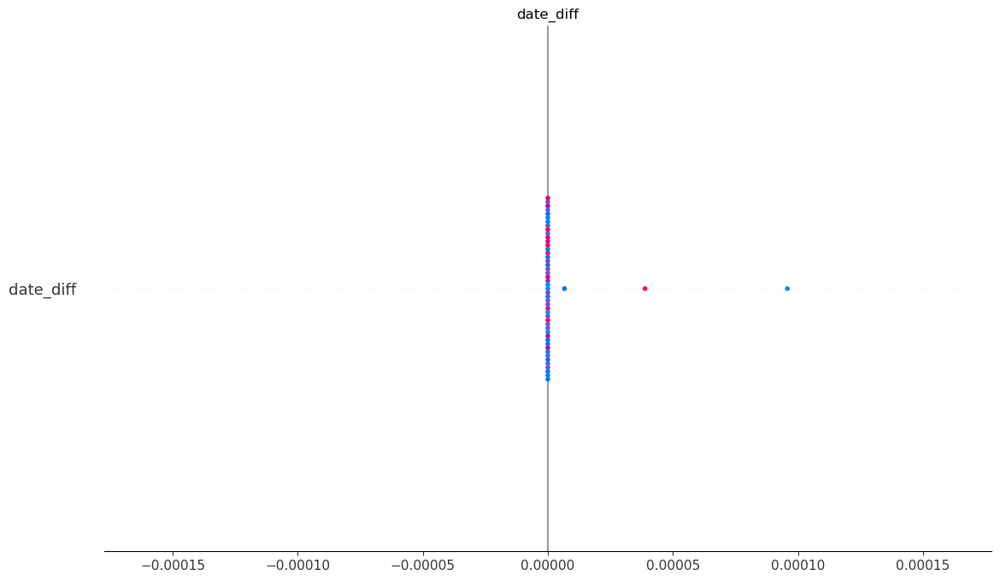

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


[('236.00 < date_diff <= 536.00', 0.0), ('32.00 < desc_similarity <= 36.00', 0.0), ('60628.50 < debit_diff <= 200000.00', 0.0), ('0.00 < credit_diff <= 100000.00', 0.0)]


In [18]:
# =============================================================================
# Explainable AI: SHAP and LIME using KernelExplainer
# =============================================================================
%pip install shap
%pip install lime
import numpy as np
import shap
import lime
import lime.lime_tabular

# -------------------------------
# SHAP Explanation using KernelExplainer
# -------------------------------

# Select a background sample from the training data (using 100 random samples)
background = X_train.iloc[np.random.choice(X_train.shape[0], 100, replace=False)]
background_np = background.values  # KernelExplainer expects a NumPy array

# Create the KernelExplainer for your trained model.
# KernelExplainer uses model.predict, so it doesn't require access to internal gradients.
explainer_shap = shap.KernelExplainer(model.predict, background_np)

# Compute SHAP values for a subset of the test set (e.g., first 50 samples)
X_test_sample = X_test.values[:50]
shap_values = explainer_shap.shap_values(X_test_sample)

# Convert feature names to a NumPy array for SHAP summary plot.
feature_names = np.array(X_train.columns.tolist())

# Visualize the summary plot for SHAP values.
shap.summary_plot(shap_values, X_test_sample, feature_names=feature_names)

# -------------------------------
# LIME Explanation using LimeTabularExplainer
# -------------------------------

# Define a custom prediction function for LIME.
def predict_fn(x):
    preds = model.predict(x)
    # Convert the single output (sigmoid) into two probabilities: [1 - pred, pred]
    return np.hstack([1 - preds, preds])

# Create a LIME Tabular Explainer using the training data as a NumPy array.
explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=feature_names.tolist(),  # LIME expects a list for feature names
    class_names=["Negative", "Positive"],
    mode="classification"
)

# Choose an instance from the test set to explain (using .iloc for positional indexing)
i = 0  # Change this index to explain a different instance
exp = explainer_lime.explain_instance(X_test.iloc[i].values, predict_fn, num_features=10)

# Instead of using exp.show_in_notebook(), display the HTML manually.
from IPython.display import HTML, display
display(HTML(exp.as_html()))
print(exp.as_list())


In [19]:
# =============================================================================
# More Detailed Explanations with SHAP and LIME (Enhanced for Binary Classification)
# =============================================================================

import numpy as np
import shap
import lime
import lime.lime_tabular
from IPython.display import HTML, display
import matplotlib.pyplot as plt

# --- Assumptions ---
# X_train, X_test, feature_names, model, and exp (the LIME explanation) are defined from previous cells.
# X_test_sample is a NumPy array of test samples, e.g.:
#    X_test_sample = X_test.values[:50]

# Re-create the SHAP explainer with a modified prediction function that returns a 1D array.
def model_predict(x):
    return model.predict(x).ravel()

# Use 100 background samples.
background = X_train.values[np.random.choice(X_train.shape[0], 100, replace=False)]
explainer_shap = shap.KernelExplainer(model_predict, background)

# Compute SHAP values for a subset of the test set.
X_test_sample = X_test.values[:50]
shap_values = explainer_shap.shap_values(X_test_sample)

# Convert feature_names to a list.
feature_names_list = feature_names.tolist() if isinstance(feature_names, np.ndarray) else list(feature_names)

# -------------------------------
# SHAP Detailed Explanations
# -------------------------------
instance_index = 0  # Change this index to select a different instance.
instance_data = X_test_sample[instance_index:instance_index+1]  # shape: (1, n_features)
pred_prob = model.predict(instance_data)
print(f"Predicted probability for instance {instance_index}: {pred_prob[0][0]:.4f}")

shap.initjs()

# Debug: Check the shape of the SHAP values array.
shap_array = np.array(shap_values[0])
print("SHAP values shape:", shap_array.shape)

# Get the SHAP value for our instance.
current_shap = shap_values[0][instance_index]

# Check if we got per-feature contributions or just a scalar.
if np.isscalar(current_shap) or np.ndim(current_shap) == 0:
    print("SHAP values computed are scalar; per-feature contributions are not available.")
else:
    # If we have a vector, ensure it matches the number of features.
    print("Number of features:", len(instance_data[0]))
    print("Length of SHAP values vector:", len(current_shap))
    
    if len(current_shap) == len(instance_data[0]) + 1:
        force_shap_values = current_shap[:-1]
    elif len(current_shap) == len(instance_data[0]):
        force_shap_values = current_shap
    else:
        raise ValueError(f"Mismatch between number of features ({len(instance_data[0])}) and SHAP values ({len(current_shap)}).")
    
    # Generate a SHAP force plot.
    force_plot = shap.force_plot(
        explainer_shap.expected_value[0],
        force_shap_values,
        instance_data,
        feature_names=feature_names_list
    )
    display(force_plot)
    
    # Generate a SHAP waterfall plot.
    try:
        waterfall_plot = shap.waterfall_plot(
            shap.Explanation(
                values=force_shap_values,
                base_values=explainer_shap.expected_value[0],
                data=instance_data[0],
                feature_names=feature_names_list
            )
        )
        display(waterfall_plot)
    except Exception as e:
        print("Waterfall plot not available:", e)
    
    # Generate a SHAP dependence plot.
    shap.dependence_plot(feature_names_list[0], shap_values[0], X_test_sample, feature_names=feature_names_list)
    
    # Print raw SHAP values.
    print("\nRaw SHAP values for instance {}:".format(instance_index))
    for name, val in zip(feature_names_list, force_shap_values):
        print(f"{name}: {val:.4f}")

# -------------------------------
# LIME Detailed Explanations
# -------------------------------
print("\n--- LIME Detailed Explanation ---")
print("LIME Local Prediction Probabilities:", exp.local_pred)
print("\nDetailed LIME Explanation per class:")
for class_idx, exp_details in exp.local_exp.items():
    print(f"\nClass {class_idx}:")
    for feature_index, weight in exp_details:
        print(f"  {feature_names_list[feature_index]}: {weight:.4f}")

with open("lime_explanation_enhanced.html", "w") as f:
    f.write(exp.as_html())
print("\nEnhanced LIME explanation saved to 'lime_explanation_enhanced.html'")





4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


  0%|          | 0/50 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 654us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 636us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 708us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 640us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 634us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 630us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 651us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 657us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 628us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 624us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 638us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 625us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
44/44 ━━━━━━━━

SHAP values shape: (4,)
SHAP values computed are scalar; per-feature contributions are not available.

--- LIME Detailed Explanation ---
LIME Local Prediction Probabilities: [1.]

Detailed LIME Explanation per class:

Class 1:
  date_diff: 0.0000
  desc_similarity: 0.0000
  debit_diff: 0.0000
  credit_diff: 0.0000

Enhanced LIME explanation saved to 'lime_explanation_enhanced.html'


In [20]:
import numpy as np
import shap
import lime
import lime.lime_tabular
from IPython.display import display, HTML
import matplotlib.pyplot as plt

# --- Step 1: Define a prediction function that returns a 2D array ---
def model_predict(x):
    y = model.predict(x)
    if y.ndim == 1:
        y = y.reshape(-1, 1)
    return y

# --- Step 2: Create an explainer using KernelExplainer ---
background = X_train.values[np.random.choice(X_train.shape[0], 100, replace=False)]
explainer_shap = shap.KernelExplainer(model_predict, background)

# Compute SHAP values for a subset of the test set.
X_test_sample = X_test.values[:50]
shap_values = explainer_shap.shap_values(X_test_sample)
print("KernelExplainer SHAP values shape:", np.array(shap_values[0]).shape)

# --- Optional: Try DeepExplainer if available ---
try:
    explainer_deep = shap.DeepExplainer(model, background)
    shap_values_deep = explainer_deep.shap_values(X_test_sample)
    print("DeepExplainer SHAP values shape:", np.array(shap_values_deep[0]).shape)
    shap_values_matrix = shap_values_deep[0]
except Exception as e:
    print("DeepExplainer not available or failed:", e)
    shap_values_matrix = np.array(shap_values[0])

# --- Step 3: Check if we got per-feature SHAP values ---
if len(shap_values_matrix.shape) != 2 or shap_values_matrix.shape[1] != X_test_sample.shape[1]:
    print("SHAP values do not contain per-feature contributions (shape:", shap_values_matrix.shape, ").")
    print("Additional SHAP plots (summary, decision, dependence) require a matrix of SHAP values (n_samples x n_features).")
else:
    # Convert feature names to a list.
    feature_names_list = feature_names.tolist() if isinstance(feature_names, np.ndarray) else list(feature_names)

    # ===============================
    # Additional SHAP Plots for Detailed Insights
    # ===============================
    
    # 1. SHAP Summary Plot (Beeswarm)
    print("Generating SHAP Summary Plot (Beeswarm)...")
    shap.summary_plot(shap_values_matrix, X_test_sample, feature_names=feature_names_list)
    
    # 2. SHAP Summary Plot (Bar)
    print("Generating SHAP Summary Plot (Bar)...")
    shap.summary_plot(shap_values_matrix, X_test_sample, feature_names=feature_names_list, plot_type="bar")
    
    # 3. SHAP Decision Plot for a Specific Instance
    instance_index = 0  # Change to the instance you want to inspect.
    print(f"Generating SHAP Decision Plot for instance {instance_index}...")
    shap.decision_plot(
        explainer_shap.expected_value[0],
        shap_values_matrix[instance_index],
        X_test_sample[instance_index:instance_index+1],
        feature_names=feature_names_list
    )
    
    # 4. SHAP Dependence Plot with Interaction Index "auto"
    feature_to_plot = feature_names_list[0]  # Change to the desired feature.
    print(f"Generating SHAP Dependence Plot for feature: {feature_to_plot}...")
    shap.dependence_plot(
        feature_to_plot,
        shap_values_matrix,
        X_test_sample,
        feature_names=feature_names_list,
        interaction_index="auto"
    )
    
    # 5. SHAP Interaction Values and Summary Plot (if supported)
    try:
        print("Computing SHAP interaction values and generating summary plot...")
        shap_interaction_values = explainer_shap.shap_interaction_values(X_test_sample)
        shap.summary_plot(shap_interaction_values[0], X_test_sample, feature_names=feature_names_list)
    except Exception as e:
        print("SHAP interaction values not available:", e)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


  0%|          | 0/50 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 638us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 636us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 651us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 630us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 632us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 623us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 662us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 654us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 632us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 629us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 646us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 637us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
44/44 ━━━━━━━━

/opt/anaconda3/lib/python3.12/site-packages/shap/explainers/_deep/deep_tf.py:94: UserWarning: Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/keras/src/models/functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor
Received: inputs=['Tensor(shape=(100, 4))']
  warnings.warn(msg)
/opt/anaconda3/lib/python3.12/site-packages/keras/src/models/functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor
Received: inputs=['Tensor(shape=(200, 4))']
  warnings.warn(msg)


DeepExplainer not available or failed: in user code:

    File "/opt/anaconda3/lib/python3.12/site-packages/shap/explainers/_deep/deep_tf.py", line 265, in grad_graph  *
        x_grad = tape.gradient(out, shap_rAnD)

    InternalError: Recorded operation 'shap_GatherV2' returned too few gradients. Expected 3 but received 4

SHAP values do not contain per-feature contributions (shape: (4, 1) ).
Additional SHAP plots (summary, decision, dependence) require a matrix of SHAP values (n_samples x n_features).


Shape of SHAP values: (50, 4)
Generating SHAP Summary Plot (Beeswarm)...


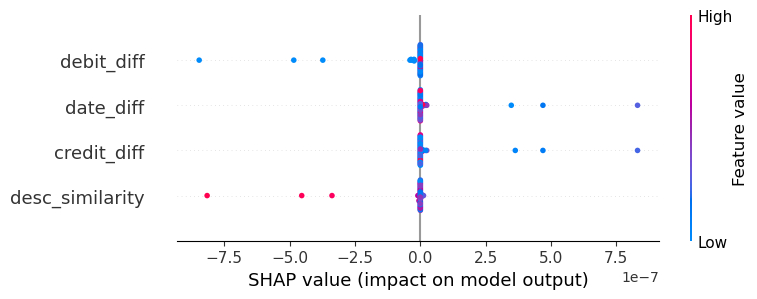

Generating SHAP Summary Plot (Bar)...


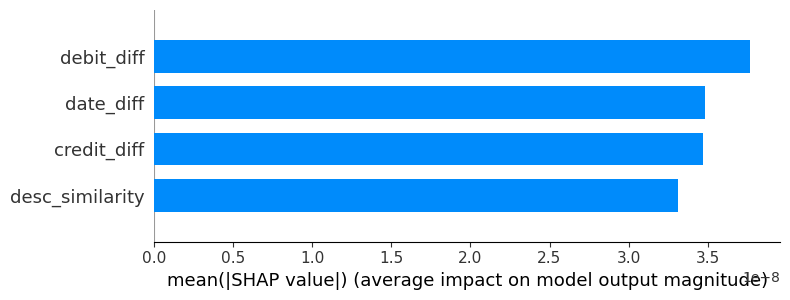

Generating SHAP Decision Plot for instance 0...


/opt/anaconda3/lib/python3.12/site-packages/shap/plots/_decision.py:78: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(xlim)


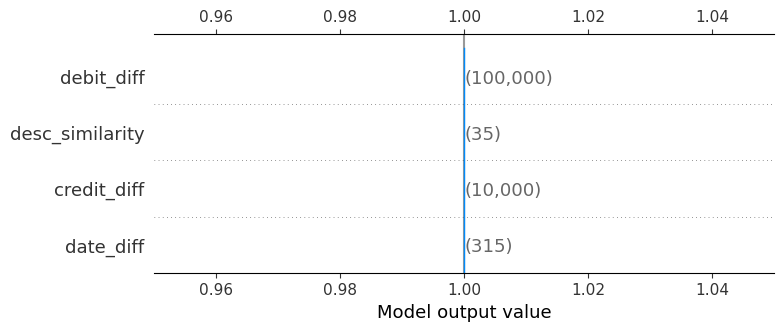

Generating SHAP Dependence Plot for feature: date_diff...


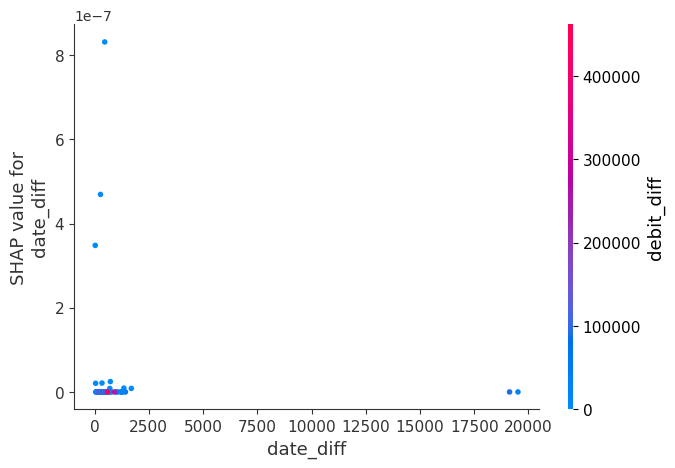

Computing SHAP interaction values and generating summary plot...
SHAP interaction values not available: The passed masker must have a .clustering attribute defined! Try shap.maskers.Partition(data) for example.

--- LIME Explanation ---
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step


LIME Explanation (as list):
[('236.00 < date_diff <= 536.00', 0.0), ('32.00 < desc_similarity <= 36.00', 0.0), ('60628.50 < debit_diff <= 200000.00', 0.0), ('0.00 < credit_diff <= 100000.00', 0.0)]

--- Partial Dependence and ICE Plots ---
347260/347260 ━━━━━━━━━━━━━━━━━━━━ 118s 341us/step
347260/347260 ━━━━━━━━━━━━━━━━━━━━ 284s 818us/step
347260/347260 ━━━━━━━━━━━━━━━━━━━━ 119s 343us/step
347260/347260 ━━━━━━━━━━━━━━━━━━━━ 120s 344us/step
347260/347260 ━━━━━━━━━━━━━━━━━━━━ 118s 339us/step
347260/347260 ━━━━━━━━━━━━━━━━━━━━ 119s 343us/step
347260/347260 ━━━━━━━━━━━━━━━━━━━━ 119s 342us/step
347260/347260 ━━━━━━━━━━━━━━━━━━━━ 119s 343us/step
347260/347260 ━━━━━━━━━━━━━━━━━━━━ 120s 345us/step
347260/347260 ━━━━━━━━━━━━━━━━━━━━ 119s 342us/step
347260/347260 ━━━━━━━━━━━━━━━━━━━━ 119s 342us/step
 94383/347260 ━━━━━━━━━━━━━━━━━━━━ 1:26 344us/step

KeyboardInterrupt: 

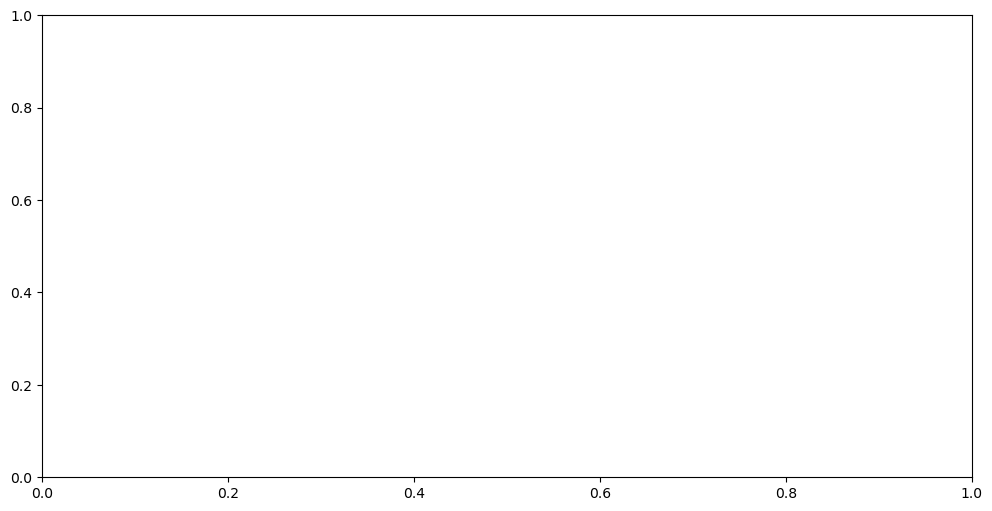

In [24]:
import numpy as np
import matplotlib.pyplot as plt
import shap
import lime
import lime.lime_tabular
from IPython.display import display, HTML

# =============================================================================
# 1. SHAP (Unified API)
# =============================================================================

# Create a masker using the training data so that SHAP knows how to perturb features.
masker = shap.maskers.Independent(X_train)

# Create an explainer with the unified API.
explainer = shap.Explainer(model, masker)

# Compute SHAP values for a subset of the test set.
X_test_sample = X_test.values[:50]  # Using first 50 samples for speed
shap_values = explainer(X_test_sample)

# Convert feature names to a list.
feature_names_list = feature_names.tolist() if isinstance(feature_names, np.ndarray) else list(feature_names)

print("Shape of SHAP values:", shap_values.values.shape)
# Expected shape: (n_samples, n_features), e.g., (50, 4)

# 1.a SHAP Summary Plot (Beeswarm)
print("Generating SHAP Summary Plot (Beeswarm)...")
shap.summary_plot(shap_values.values, X_test_sample, feature_names=feature_names_list)

# 1.b SHAP Summary Plot (Bar)
print("Generating SHAP Summary Plot (Bar)...")
shap.summary_plot(shap_values.values, X_test_sample, feature_names=feature_names_list, plot_type="bar")

# 1.c SHAP Decision Plot for a Specific Instance
instance_index = 0  # Change to inspect a different instance
print(f"Generating SHAP Decision Plot for instance {instance_index}...")
shap.decision_plot(
    shap_values.base_values[instance_index],
    shap_values.values[instance_index],
    X_test_sample[instance_index:instance_index+1],
    feature_names=feature_names_list
)

# 1.d SHAP Dependence Plot (with interaction "auto")
feature_to_plot = feature_names_list[0]  # Change as needed
print(f"Generating SHAP Dependence Plot for feature: {feature_to_plot}...")
shap.dependence_plot(
    feature_to_plot,
    shap_values.values,
    X_test_sample,
    feature_names=feature_names_list,
    interaction_index="auto"
)

# 1.e SHAP Interaction Values (if supported)
try:
    print("Computing SHAP interaction values and generating summary plot...")
    interaction_explainer = shap.Explainer(model, masker, algorithm="partition")
    shap_interaction_values = interaction_explainer(X_test_sample, check_additivity=False)
    shap.summary_plot(shap_interaction_values.values, X_test_sample, feature_names=feature_names_list)
except Exception as e:
    print("SHAP interaction values not available:", e)

# =============================================================================
# 2. LIME (Local Interpretable Model-Agnostic Explanations)
# =============================================================================

print("\n--- LIME Explanation ---")

# Define a custom prediction function that returns two columns (for binary classification).
def predict_proba(x):
    preds = model.predict(x)
    if preds.ndim == 1:
        preds = preds.reshape(-1, 1)
    return np.hstack([1 - preds, preds])

lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=feature_names_list,
    class_names=["Negative", "Positive"],
    mode="classification"
)

# Choose an instance to explain.
instance_to_explain = X_test.iloc[0].values  # 1D array for a single instance
lime_exp = lime_explainer.explain_instance(instance_to_explain, predict_proba, num_features=len(feature_names_list))
display(HTML(lime_exp.as_html()))
print("LIME Explanation (as list):")
print(lime_exp.as_list())

# =============================================================================
# 3. Partial Dependence Plots (PDP) and ICE Plots
# =============================================================================

print("\n--- Partial Dependence and ICE Plots ---")
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.inspection import PartialDependenceDisplay

# Create a scikit-learn wrapper for your Keras model.
class KerasWrapper(BaseEstimator, ClassifierMixin):
    def __init__(self, model):
        self.model = model
    def fit(self, X, y=None):
        # Dummy fit: mark the estimator as fitted by storing number of features.
        self.n_features_in_ = X.shape[1]
        if y is not None:
            self.classes_ = np.unique(y)
        else:
            # Assume binary classification if labels are not provided.
            self.classes_ = np.array([0, 1])
        return self
    def predict(self, X):
        preds = self.model.predict(X)
        # Convert probabilities to class labels using a 0.5 threshold.
        return (preds > 0.5).astype(int).ravel()
    def predict_proba(self, X):
        preds = self.model.predict(X)
        if preds.ndim == 1:
            preds = preds.reshape(-1, 1)
        return np.hstack([1 - preds, preds])

wrapped_model = KerasWrapper(model)
# Fit the wrapper. If y_train is defined, use it; otherwise, use dummy labels.
try:
    wrapped_model.fit(X_train.values, y_train)
except NameError:
    print("y_train is not defined. Using dummy labels.")
    dummy_y = np.zeros(X_train.shape[0])
    wrapped_model.fit(X_train.values, dummy_y)

features_to_plot = [0, 1]  # Adjust based on your features.
fig, ax = plt.subplots(figsize=(12, 6))
PartialDependenceDisplay.from_estimator(
    wrapped_model,
    X_train.values,
    features=features_to_plot,
    feature_names=feature_names_list,
    ax=ax
)
plt.suptitle("Partial Dependence Plots")
plt.show()

# =============================================================================
# 4. Integrated Gradients (using tf-explain)
# =============================================================================

print("\n--- Integrated Gradients Explanation ---")
try:
    from tf_explain.core.integrated_gradients import IntegratedGradients
    
    instance_ig = X_test.values[0:1]  # 2D array for one instance
    data_ig = ([instance_ig], None)   # Labels are not required for explanation
    ig_explainer = IntegratedGradients()
    # Set class_index to 0 (adjust as needed)
    grid = ig_explainer.explain(data_ig, model, class_index=0)
    
    plt.figure(figsize=(8, 6))
    plt.imshow(grid)
    plt.axis("off")
    plt.title("Integrated Gradients")
    plt.show()
except Exception as e:
    print("Integrated Gradients explanation failed:", e)


In [22]:
import numpy as np
from pytorch_tabnet.tab_model import TabNetClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Ensure your training and test data are numpy arrays.
X_train_np = X_train.values
X_test_np = X_test.values
y_train_np = y_train.values
y_test_np = y_test.values

# Initialize the TabNetClassifier
clf = TabNetClassifier(
    optimizer_params=dict(lr=2e-2),
    seed=42,
    verbose=10
)

# Fit the model.
clf.fit(
    X_train_np, y_train_np,
    eval_set=[(X_train_np, y_train_np), (X_test_np, y_test_np)],
    eval_metric=['accuracy'],
    max_epochs=100,
    patience=10,
    batch_size=1024,
    virtual_batch_size=128,
    num_workers=0,
    drop_last=False
)

# Predict on the test set.
preds = clf.predict(X_test_np)

# Evaluation
print("Confusion Matrix:")
print(confusion_matrix(y_test_np, preds))
print("\nClassification Report:")
print(classification_report(y_test_np, preds))
print(f"\nAccuracy: {accuracy_score(y_test_np, preds)}")


ModuleNotFoundError: No module named 'pytorch_tabnet'

In [ ]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier()
model.fit(X_train, y_train)

RandomForestClassifier()

In [ ]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tcn import TCN  # Install via pip install tcn

# Assuming X_train and X_test are from your train_test_split
# Reshape your data: treat each sample as a sequence of length 1
X_train_tcn = np.expand_dims(X_train.values, axis=1)  # shape becomes (samples, 1, n_features)
X_test_tcn = np.expand_dims(X_test.values, axis=1)

# Build the TCN model
model = Sequential([
    TCN(input_shape=(X_train_tcn.shape[1], X_train_tcn.shape[2])),
    Flatten(),
    Dense(1, activation='sigmoid')  # for binary classification
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train_tcn, y_train, epochs=10, batch_size=32, validation_split=0.2)

# Evaluate on the test set
score = model.evaluate(X_test_tcn, y_test)
print("Test loss:", score[0])
print("Test accuracy:", score[1])


Epoch 1/10


/opt/anaconda3/envs/auditx/lib/python3.12/site-packages/tcn/tcn.py:227: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super(TCN, self).__init__(**kwargs)


 51479/277808 ━━━━━━━━━━━━━━━━━━━━ 13:51 4ms/step - accuracy: 0.9990 - loss: 444.1367

KeyboardInterrupt: 

In [ ]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

from imblearn.over_sampling import SMOTE

# Assuming X_train and y_train have been defined from your train-test split:
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

# Fit the model using the resampled training data
model = RandomForestClassifier(random_state=42)
model.fit(X_train_res, y_train_res)

# Now evaluate on the original test set
y_pred = model.predict(X_test)

# Print the confusion matrix, classification report, and accuracy score
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

print(f"\nAccuracy: {accuracy_score(y_test, y_pred)}")


Confusion Matrix:
[[   1316       0]
 [      2 2776759]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1316
           1       1.00      1.00      1.00   2776761

    accuracy                           1.00   2778077
   macro avg       1.00      1.00      1.00   2778077
weighted avg       1.00      1.00      1.00   2778077


Accuracy: 0.99999928007755


In [ ]:
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, StratifiedKFold
import numpy as np

# Define the pipeline with SMOTE and the classifier
pipeline = Pipeline([
    ('smote', SMOTE(random_state=42)),
    ('rf', RandomForestClassifier(random_state=42))
])

# Define cross-validation strategy, e.g., StratifiedKFold ensures class distribution is maintained
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Evaluate the pipeline using cross-validation on the full dataset X and y
# Replace X and y with your feature matrix and target variable, respectively.
scores = cross_val_score(pipeline, X, y, cv=cv, scoring='accuracy')

print("Cross-Validation Accuracy Scores:", scores)
print("Mean Accuracy:", np.mean(scores))


Cross-Validation Accuracy Scores: [1. 1. 1. 1. 1.]
Mean Accuracy: 1.0


In [ ]:
# Predict probabilities
pairs["match_probability"] = model.predict_proba(pairs[features])[:, 1]

# Flag mismatches (threshold = 0.5)
pairs["is_mismatch"] = pairs["match_probability"] < 0.5

In [ ]:
mismatches = pairs[pairs["is_mismatch"]]
print(mismatches[["cb_desc", "bs_desc", "debit_diff", "balance_diff"]])

                                               cb_desc  \
0                  software consulting service payment   
3740                     office rent payment - january   
7480      client payment - custom software development   
11220           software subscription - yearly renewal   
14960                    cloud application development   
...                                                ...   
13875424                    utility payment - internet   
13879164                     salary payment - employee   
13882904                     salary payment - employee   
13886612                    client payment - project b   
13886644                    client payment - project b   

                                               bs_desc  debit_diff  \
0                  software consulting service payment         0.0   
3740                     office rent payment - january         0.0   
7480      client payment - custom software development         0.0   
11220           softwar

In [ ]:
import tabulate
from tabulate import tabulate

def generate_report(mismatches):
    report_data = []
    for _, row in mismatches.iterrows():
        report_data.append({
            "Cash Book Date": row["cb_date"].strftime("%Y-%m-%d"),
            "Bank Statement Date": row["bs_date"].strftime("%Y-%m-%d"),
            "Cash Book Description": row["cb_desc"],
            "Bank Statement Description": row["bs_desc"],
            "Debit Difference": row["debit_diff"],
            "Description Similarity": row["desc_similarity"],
            "Date Difference (Days)": row["date_diff"]
        })

    report = tabulate(report_data, headers="keys", tablefmt="fancy_grid")
    print("\nMismatch Report\n")
    print(report)
    return report

In [ ]:
generate_report(mismatches)


Mismatch Report

╒══════════════════╤═══════════════════════╤═════════════════════════════════════════════════════════════════╤═════════════════════════════════════════════════════════════════╤════════════════════╤══════════════════════════╤══════════════════════════╕
│ Cash Book Date   │ Bank Statement Date   │ Cash Book Description                                           │ Bank Statement Description                                      │   Debit Difference │   Description Similarity │   Date Difference (Days) │
╞══════════════════╪═══════════════════════╪═════════════════════════════════════════════════════════════════╪═════════════════════════════════════════════════════════════════╪════════════════════╪══════════════════════════╪══════════════════════════╡
│ 2020-01-01       │ 2020-01-01            │ software consulting service payment                             │ software consulting service payment                             │                  0 │                      100 │  

'╒══════════════════╤═══════════════════════╤═════════════════════════════════════════════════════════════════╤═════════════════════════════════════════════════════════════════╤════════════════════╤══════════════════════════╤══════════════════════════╕\n│ Cash Book Date   │ Bank Statement Date   │ Cash Book Description                                           │ Bank Statement Description                                      │   Debit Difference │   Description Similarity │   Date Difference (Days) │\n╞══════════════════╪═══════════════════════╪═════════════════════════════════════════════════════════════════╪═════════════════════════════════════════════════════════════════╪════════════════════╪══════════════════════════╪══════════════════════════╡\n│ 2020-01-01       │ 2020-01-01            │ software consulting service payment                             │ software consulting service payment                             │                  0 │                      100 │                

# Model Building with Neural Net

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_features = scaler.fit_transform(pairs[["date_diff", "desc_similarity", "debit_diff", "credit_diff"]])
X = pd.DataFrame(scaled_features, columns=["date_diff", "desc_similarity", "debit_diff", "credit_diff"])
y = pairs["label"]

In [ ]:
print("Scaler Mean:", scaler.mean_)
print("Scaler Scale:", scaler.scale_)

Scaler Mean: [7.95311941e+02 3.72336238e+01 2.69053997e+05 3.36336783e+05]
Scaler Scale: [1.76541753e+03 1.02237670e+01 4.48567799e+06 6.87205598e+05]


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset, random_split

X_tensor = torch.tensor(X.values, dtype=torch.float32)
y_tensor = torch.tensor(y.values, dtype=torch.float32)

dataset = TensorDataset(X_tensor, y_tensor)
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

class MismatchNN(nn.Module):
    def __init__(self):
        super(MismatchNN, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(4, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(64, 32),
            nn.BatchNorm1d(32),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(32, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.model(x)

model = MismatchNN()

In [ ]:
# Loss and Optimizer
criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

# Training the Model
def train_model(model, train_loader, num_epochs=20):
    model.train()
    for epoch in range(num_epochs):
        epoch_loss = 0
        for batch in train_loader:
            X_batch, y_batch = batch
            optimizer.zero_grad()
            outputs = model(X_batch).squeeze()
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()

        scheduler.step()  # Adjust learning rate
        print(f"Epoch {epoch + 1}/{num_epochs}, Loss: {epoch_loss:.4f}")

train_model(model, train_loader)

KeyboardInterrupt: 

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

def evaluate_model(model, test_loader):
    model.eval()
    y_true = []
    y_pred = []
    with torch.no_grad():
        for batch in test_loader:
            X_batch, y_batch = batch
            outputs = model(X_batch).squeeze()
            preds = (outputs > 0.5).float()  # Threshold at 0.5
            y_true.extend(y_batch.numpy())
            y_pred.extend(preds.numpy())

    print("Confusion Matrix:\n", confusion_matrix(y_true, y_pred))
    print("Classification Report:\n", classification_report(y_true, y_pred))

evaluate_model(model, test_loader)

Confusion Matrix:
 [[      0    1290]
 [      0 2776787]]


/opt/anaconda3/envs/auditx/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00      1290
         1.0       1.00      1.00      1.00   2776787

    accuracy                           1.00   2778077
   macro avg       0.50      0.50      0.50   2778077
weighted avg       1.00      1.00      1.00   2778077



/opt/anaconda3/envs/auditx/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/envs/auditx/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
def predict_and_report(model, data, scaler, original_pairs):
    # Preprocess input data
    scaled_data = scaler.transform(data[["date_diff", "desc_similarity", "debit_diff", "credit_diff"]])
    X_tensor = torch.tensor(scaled_data, dtype=torch.float32)

    # Predict
    model.eval()
    with torch.no_grad():
        predictions = model(X_tensor).squeeze()
        mismatches = (predictions > 0.5).numpy()

    # Generate report for mismatches
    mismatch_records = original_pairs[mismatches]
    print("\nMismatch Report:")
    for _, record in mismatch_records.iterrows():
        print(f"- Cash Book: {record['cb_desc']} | Bank Statement: {record['bs_desc']}")
        print(f"  Date Difference: {record['date_diff']} days, Description Similarity: {record['desc_similarity']}%, Debit Difference: {record['debit_diff']}\n")

predict_and_report(model, X, scaler, pairs)


Mismatch Report:


In [ ]:
import torch

torch.onnx.export(
    model,
    torch.randn(1, 4),
    "/content/drive/MyDrive/Ai Auditbot/model_ONNX/mismatch_model.onnx",
    input_names=["input"],
    output_names=["output"],
    dynamic_axes={"input": {0: "batch_size"}, "output": {0: "batch_size"}}
)
# netron mismatch_model.onnx

In [ ]:
torch.save(model.state_dict(), "/content/drive/MyDrive/Ai Auditbot/model/mismatch_nn_model.pth")

import joblib
scaler_data = {"mean": scaler.mean_, "scale": scaler.scale_}
joblib.dump(scaler_data, "scaler.pkl")

['scaler.pkl']

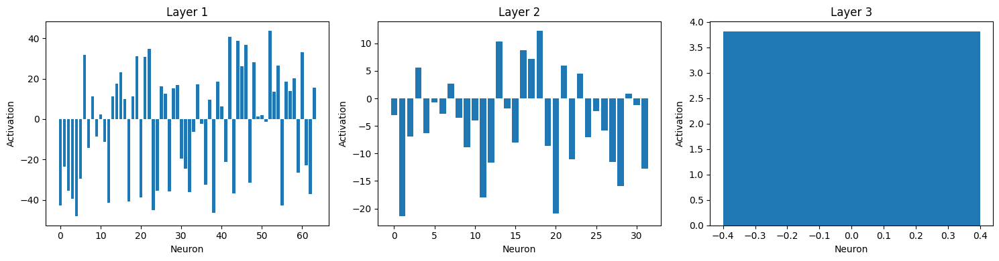

In [ ]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt

sample_input = torch.tensor([[0.0, 100.0, 0.0, 0.0]])
activations = {}

def hook_fn(module, input, output):
    activations[module] = output

for i, layer in enumerate(model.model):
    if isinstance(layer, nn.Linear):
        layer.register_forward_hook(hook_fn)

output = model(sample_input)

layers = []
activation_data = []
for layer, activation in activations.items():
    layers.append(str(layer))
    activation_data.append(activation.detach().numpy()[0])

fig, axes = plt.subplots(1, len(activation_data), figsize=(15, 4))
for i, ax in enumerate(axes):
    ax.bar(range(len(activation_data[i])), activation_data[i])
    ax.set_title(f"Layer {i+1}")
    ax.set_xlabel("Neuron")
    ax.set_ylabel("Activation")
plt.tight_layout()
plt.show()